In [1]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

# replicate Meshal's pretty plotting colors
from matplotlib import colors
gray_red = colors.LinearSegmentedColormap.from_list("grouping", ["lightgray", "red", "darkred"], N = 128)

sc.set_figure_params(dpi=100, frameon=False)
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.3 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


In [2]:
adata = sc.read('2301_annot_patient_integrated_ambient_removed.h5ad')

### General plots

In [3]:
adata.obs['celltype_coarse'] = adata.obs.cell_type.replace({
    'Goblet': 'Secretory',
    'Club': 'Secretory',
})

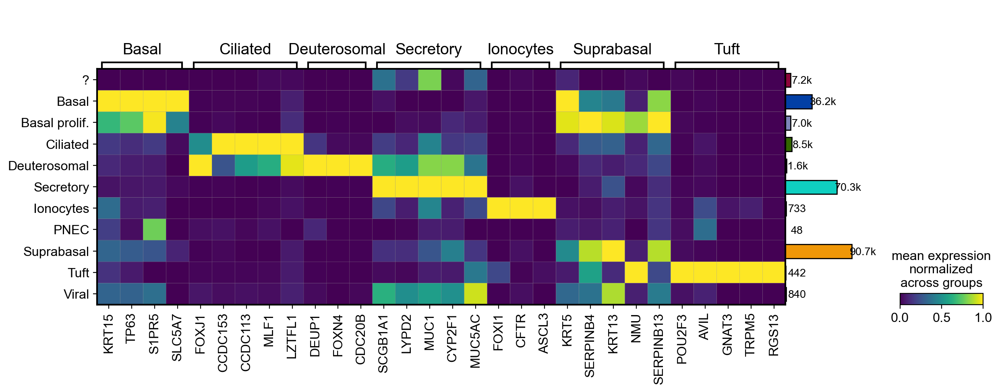

In [4]:
markers_fine = {
#     'at1, at2': ['RTKN2', 'AGER', 'NCKAP5', 'SFTPC'],
    'Basal': ['KRT15', 'TP63', 'S1PR5', 'SLC5A7'],
    'Ciliated': ['FOXJ1', 'CCDC153', 'CCDC113', 'MLF1', 'LZTFL1'],
    'Deuterosomal':['DEUP1', 'FOXN4', 'CDC20B'],
    'Secretory': ['SCGB1A1', 'LYPD2', 'MUC1', 'CYP2F1', 'MUC5AC'],
    'Ionocytes': ['FOXI1', 'CFTR', 'ASCL3'],
    'Suprabasal': ['KRT5', 'SERPINB4', 'KRT13', 'NMU', 'SERPINB13'],
#     'viral':[]
    'Tuft': ['POU2F3', 'AVIL', 'GNAT3', 'TRPM5', 'RGS13'],
}
mp = sc.pl.matrixplot(
    adata,
    var_names=markers_fine,
    groupby='celltype_coarse',
    standard_scale='var',
    var_group_rotation=0,
    colorbar_title='mean expression\nnormalized\nacross groups',
    return_fig=True
)
mp.add_totals(color=adata.uns['cell_type_colors'], size=1.5).style(edge_color='grey').show()

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


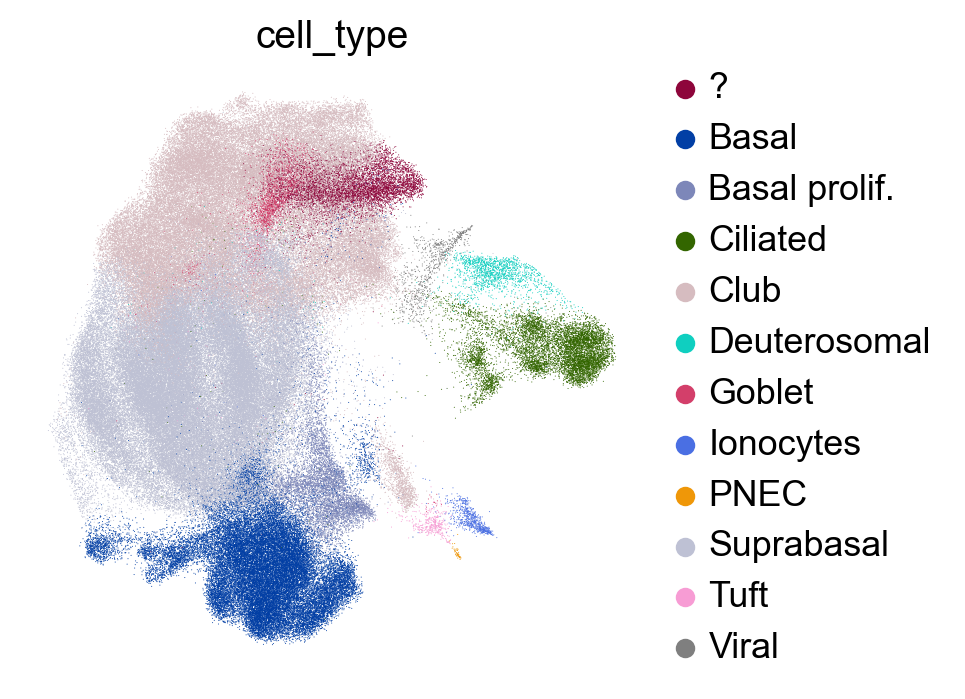

In [5]:
sc.pl.umap(adata, color='cell_type')

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


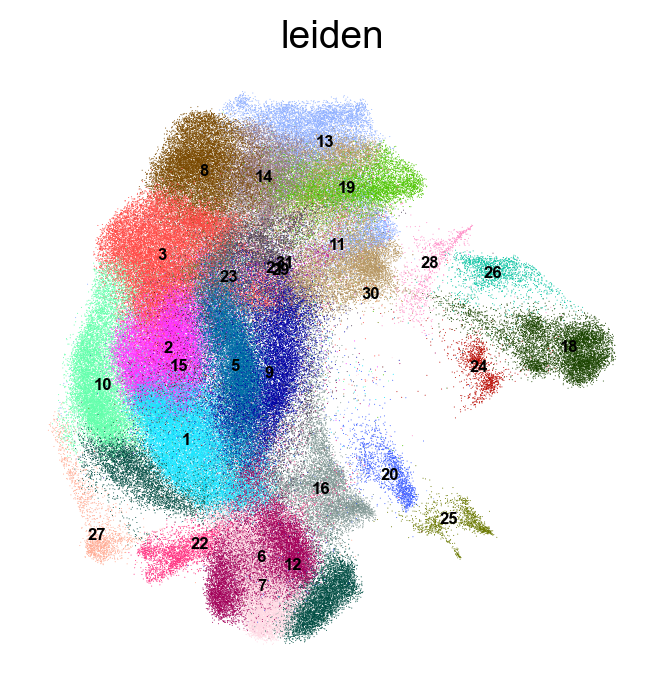

In [6]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', legend_fontsize=6)

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


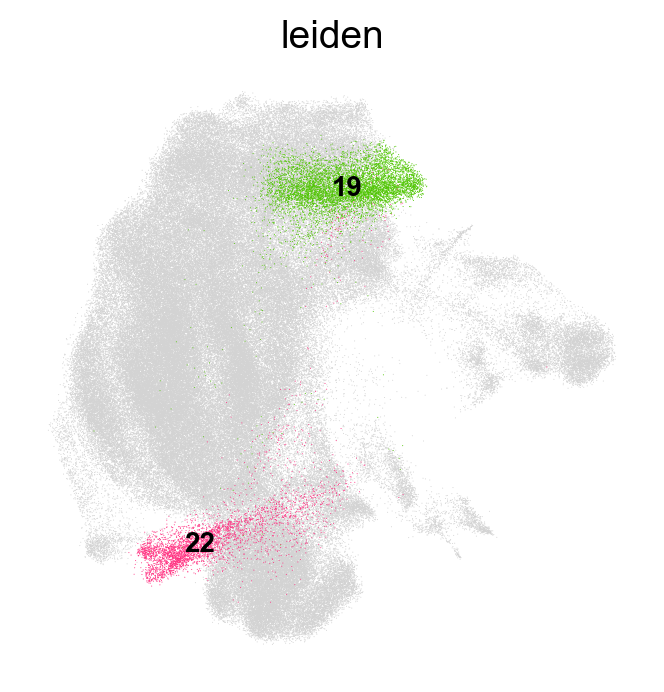

In [7]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', legend_fontsize=10, na_in_legend=False, groups=['19', '22'])

### Plot markers

In [8]:
df = pd.read_excel('sentinel_markers_withLFC.xlsx', index_col=0)

In [9]:
markers = df[df['shared markers'] == '+']['Gene name'].values

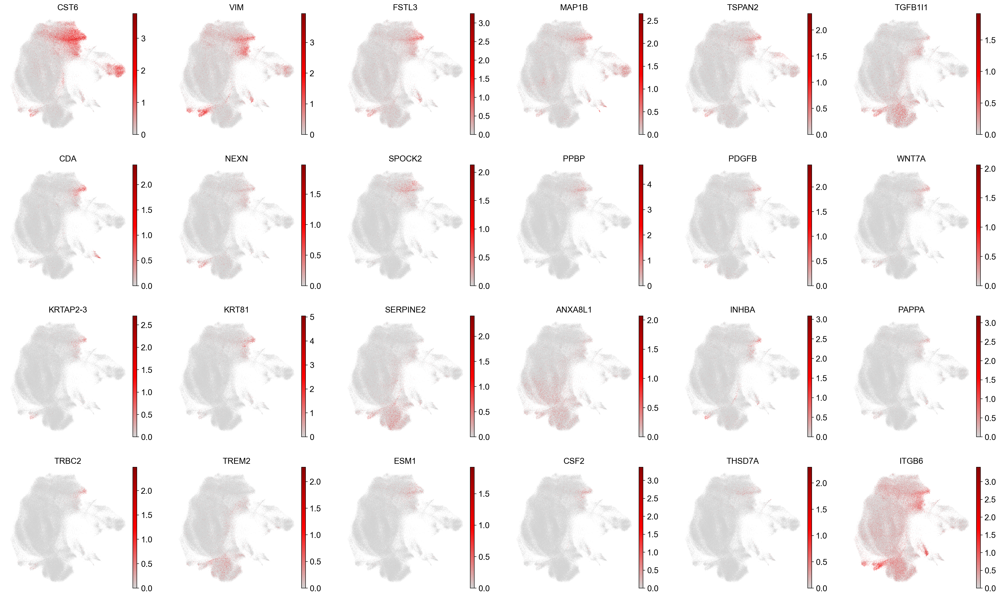

In [20]:
sc.pl.umap(adata, color=list(markers) + ['ITGB6'], cmap=gray_red, ncols=6)

In [24]:
sc.tl.dendrogram(adata, 'leiden', use_rep='X_scVI')

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


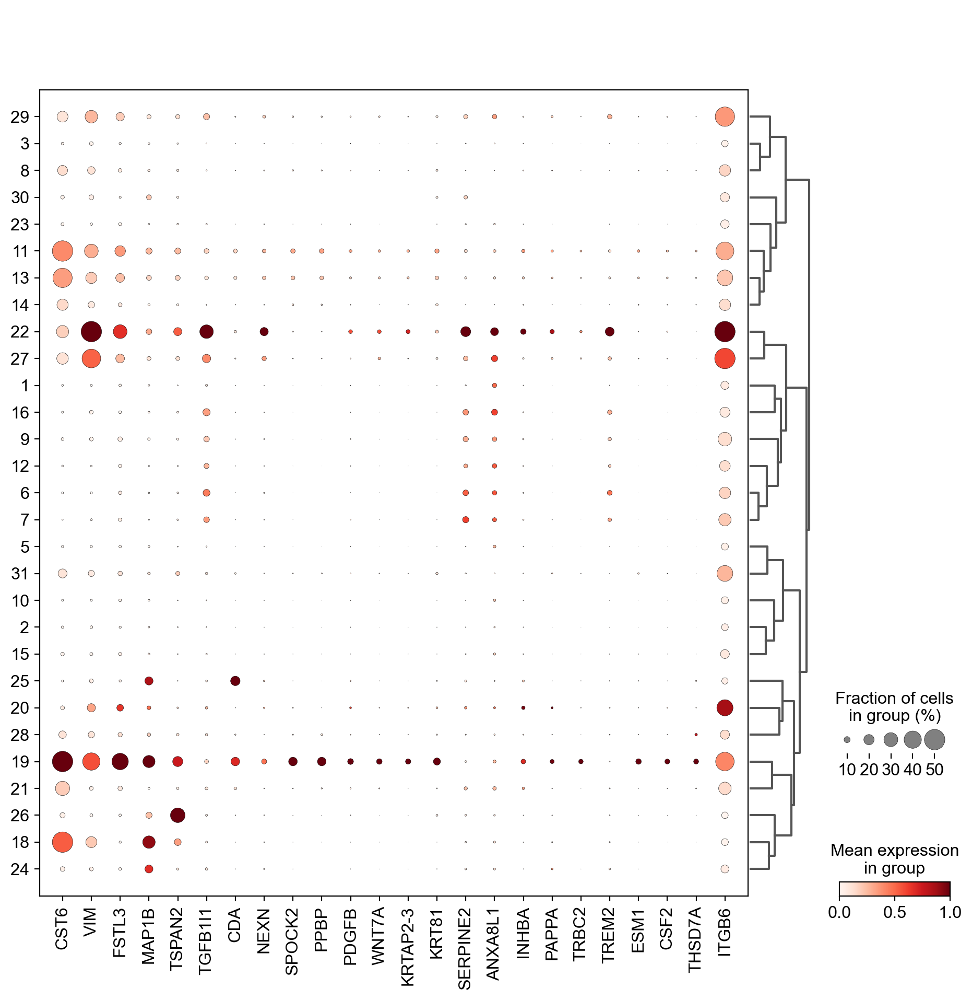

In [25]:
sc.pl.dotplot(
    adata,
    var_names=list(markers) + ['ITGB6'],
    groupby='leiden', standard_scale='var',
    dendrogram=True, dot_max=.5
)

### Add additional annotations to cluster markers to generate final csv

In [50]:
fig = sc.pl.dotplot(adata[adata.obs.leiden.isin(['19', '22'])], groupby='leiden', var_names=list(set(df.index) & set(adata.var_names)), return_fig=True)

In [57]:
annot_df = pd.read_excel('sentinels_annotated.xlsx').drop_duplicates(subset='Gene name').set_index('Gene name')

average_exp = fig.dot_color_df.T
average_exp.columns = ['secretory_exp', 'suprabasal_exp']

df = pd.concat([
    pd.read_csv('clustercombined_responsive_markers.csv').set_index('names')[['scores', 'logfoldchanges']],
    average_exp,
    annot_df
], axis=1)
df

,scores,logfoldchanges,secretory_exp,suprabasal_exp,Protein name,suprabasal sentinels,secretory sentinels,shared markers,Gene ontology (molecular function),Gene ontology (cellular component),Gene ontology (biological process),Subcellular location [CC],Gene ontology (GO),Keywords,ENSG,ENST,ENSP,Uniprot
CST6,64.363610,2.038290,1.095372,0.188519,Cystatin-M,+,NaN,+,cysteine-type endopeptidase inhibitor activity...,cornified envelope [GO:0001533];extracellular ...,anatomical structure morphogenesis [GO:0009653...,SUBCELLULAR LOCATION: Secreted.,anatomical structure morphogenesis [GO:0009653...,3D-structure;Disease variant;Disulfide bond;Ec...,ENSG00000175315,ENST00000312134,ENSP00000311313,Q15828;Q540N7
VIM,49.569790,2.184246,0.423544,0.668207,Vimentin,NaN,+,+,double-stranded RNA binding [GO:0003725];ident...,cell leading edge [GO:0031252];cytoplasm [GO:0...,aggrephagy [GO:0035973];astrocyte development ...,SUBCELLULAR LOCATION: Cytoplasm {ECO:0000269|P...,aggrephagy [GO:0035973];astrocyte development ...,3D-structure;Acetylation;Cataract;Cell membran...,ENSG00000026025,ENST00000224237;ENST00000421459;ENST0000046954...,ENSP00000224237;ENSP00000391842;ENSP0000043170...,B0YJC2;B0YJC4;B0YJC5;D3DRU4;P08670;Q15867;Q158...
FSTL3,41.283615,2.055094,0.259935,0.163799,Follistatin-related protein 3,NaN,NaN,+,activin binding [GO:0048185];fibronectin bindi...,endoplasmic reticulum lumen [GO:0005788];extra...,adrenal gland development [GO:0030325];cell di...,SUBCELLULAR LOCATION: [Isoform 1]: Secreted.;S...,activin binding [GO:0048185];adrenal gland dev...,3D-structure;Alternative initiation;Chromosoma...,ENSG00000070404,ENST00000166139;ENST00000588773;ENST0000058918...,ENSP00000166139;ENSP00000466383;ENSP0000046855...,A0A087WTD3;A0A087X1Q2;A8K7E3;K7EM71;K7ES54;O95633
MAP1B,23.531380,2.091394,0.153099,0.045738,MAP1 light chain LC1;MAP1B heavy chain;Microtu...,+,NaN,+,actin binding [GO:0003779];microtubule binding...,apical dendrite [GO:0097440];axon [GO:0030424]...,axon extension [GO:0048675];axonogenesis [GO:0...,SUBCELLULAR LOCATION: [MAP1 light chain LC1]: ...,actin binding [GO:0003779];apical dendrite [GO...,Acetylation;Cell junction;Cell projection;Cyto...,ENSG00000131711,ENST00000296755;ENST00000504492;ENST0000051164...,ENSP00000296755;ENSP00000423416;ENSP0000042344...,A2BDK5;D6RA32;D6RA40;D6RCL2;D6RGJ3;P46821
TSPAN2,21.506937,2.121970,0.112083,0.073520,Tetraspanin;Tetraspanin-2,NaN,NaN,+,NaN,integral component of membrane [GO:0016021];in...,astrocyte development [GO:0014002];axon develo...,Multi-pass membrane protein {ECO:0000305}.;SUB...,astrocyte development [GO:0014002];axon develo...,Alternative splicing;Glycoprotein;Membrane;Ref...,ENSG00000134198,ENST00000369515;ENST00000369516;ENST00000433172,ENSP00000358528;ENSP00000358529;ENSP00000415256,B1AKP1;B1AKP2;D6PTH4;O60636;Q5TET2;Q8WU05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PROCR,NaN,NaN,0.005747,0.038802,Endothelial protein C receptor,NaN,+,NaN,signaling receptor activity [GO:0038023],cell surface [GO:0009986];centrosome [GO:00058...,blood coagulation [GO:0007596];negative regula...,Single-pass type I membrane protein.;SUBCELLUL...,blood coagulation [GO:0007596];cell surface [G...,3D-structure;Blood coagulation;Disulfide bond;...,ENSG00000101000,ENST00000216968,ENSP00000216968,B2RC04;Q14218;Q6IB56;Q96CB3;Q9ULX1;Q9UNN8
APOE,NaN,NaN,0.068994,0.285859,Apolipoprotein E,NaN,+,NaN,amyloid-beta binding [GO:0001540];antioxidant ...,blood microparticle [GO:0072562];chylomicron [...,AMPA glutamate receptor clustering [GO:0097113...,SUBCELLULAR LOCATION: Secreted {ECO:0000269|Pu...,AMPA glutamate receptor clustering [GO:0097113...,3D-structure;Alzheimer disease;Amyloidosis;Cho...,ENSG00000130203,ENST00000252486;ENST00000425718;ENST0000043415...,ENSP00000252486;ENSP00000410423;ENSP0000041313...,B2RC15;C0JYY5;E7ERP7;E9PEV4;H0Y7L5;P02649;Q9P2S4
C15orf48;NMES1,NaN,NaN,NaN,NaN,Normal mucosa of esophagus-specific gene 1 pro...,+,NaN,NaN,NaN,mitochondrial respirator

In [58]:
df.reset_index().rename({'index':'Gene name'}, axis=1).to_excel('sentinel_markers_withLFC.xlsx')